In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

colors = [
        '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
        '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
        '#1a55FF', '#55a8ff', '#6df7fd', '#f2ad92', '#d96459',
        '#f2a541', '#f2d83d', '#b2d732', '#33d9b2', '#127475',
        '#004777'
    ]


grouped_df_dept = pd.read_csv("grouped_df_dept.csv")
income_df = pd.read_csv('nhood_median_income.csv')
poverty_df = pd.read_csv('nhood_poverty_rate.csv')
race_df = pd.read_csv('nhood_race_budget.csv')
grouped_df_dept = grouped_df_dept.rename(columns={'Total_Project_Budget': 'Total_Dept_Budget'})
grouped_df_dept

,Neighborhood,PM_Department,Total_Dept_Budget
0,Allston/Brighton,Parks and Recreation Department,7480000.0
1,Allston/Brighton,Public Facilities Department,35125000.0
2,Allston/Brighton,Public Works Department,15000000.0
3,Back Bay,Boston Public Library,400000.0
4,Back Bay,Boston Transportation Department,9876299.0
...,...,...,...
82,West End,Public Facilities Department,3000000.0
83,West End,Public Works Department,2000000.0
84,West Roxbury,Boston Transportation Department,400000.0
85,West Roxbury,Parks and Recreation Department,9475000.0


In [3]:
race_df

,Neighborhood,Budget_per_Capita,White %,Black %,Hispanic %,Asian %,Other %
0,Back Bay,3680.048305,0.733510,0.042794,0.096440,0.107800,0.019457
1,Beacon Hill,3566.542289,0.836857,0.014303,0.060116,0.059909,0.028814
2,Charlestown,26707.510809,0.738663,0.051232,0.110508,0.081096,0.018502
3,Dorchester,1886.479596,0.222553,0.439583,0.199261,0.098811,0.039792
4,East Boston,1321.496519,0.338764,0.024776,0.565072,0.045850,0.025538
5,Hyde Park,169.946563,0.224001,0.463519,0.263128,0.019602,0.029750
6,Jamaica Plain,1976.717156,0.551374,0.142536,0.220251,0.049037,0.036802
7,Mattapan,3298.510822,0.060467,0.743501,0.141453,0.018718,0.035860
8,Mission Hill,301.519153,0.411596,0.153112,0.213735,0.196652,0.024905
9,North End,10909.246771,0.879186,0.003315,0.070179,0.032804,0.014516


In [4]:
total_budget_df = poverty_df[['Neighborhood', 'Total_Project_Budget']]
income_df = income_df.drop(columns='Total_Project_Budget')
income_df

,Neighborhood,Median Income
0,Back Bay,111185.0
1,Beacon Hill,110840.9
2,Charlestown,127399.6
3,Dorchester,55009.1
4,East Boston,60510.4
5,Hyde Park,72953.1
6,Jamaica Plain,97068.8
7,Mattapan,55968.4
8,Mission Hill,42803.0
9,North End,103998.6


In [5]:
poverty_df = poverty_df.drop(columns='Total_Project_Budget')
poverty_df

,Neighborhood,Poverty rate
0,Back Bay,0.119351
1,Beacon Hill,0.063726
2,Charlestown,0.144394
3,Dorchester,0.222179
4,East Boston,0.160466
5,Hyde Park,0.149196
6,Jamaica Plain,0.128023
7,Mattapan,0.201043
8,Mission Hill,0.370441
9,North End,0.080382


In [6]:
df = grouped_df_dept.merge(race_df, on='Neighborhood')
df = df.merge(poverty_df, on='Neighborhood')
df = df.merge(income_df, on='Neighborhood')
df = df.merge(total_budget_df, on='Neighborhood')

############################################################################################################

# top 3 neighborhoods by median income
top_3 = income_df.nlargest(3, 'Median Income')['Neighborhood'].to_frame()
income_top = df[df['Neighborhood'].isin(top_3['Neighborhood'].unique())]

# bottom 3 neighborhoods by median income
bottom_3 = income_df.nsmallest(3, 'Median Income')['Neighborhood'].to_frame()
income_bottom = df[df['Neighborhood'].isin(bottom_3['Neighborhood'].unique())]
income_bottom

############################################################################################################

# top 3 whitest neighborhoods
top_3 = race_df.nlargest(3, 'White %')['Neighborhood'].to_frame()
white_top = df[df['Neighborhood'].isin(top_3['Neighborhood'].unique())]

# bottom 3 whitest neighborhoods
bottom_3 = race_df.nsmallest(3, 'White %')['Neighborhood'].to_frame()
white_bottom = df[df['Neighborhood'].isin(bottom_3['Neighborhood'].unique())]

############################################################################################################

# top 3 highest poverty rate
top_3 = poverty_df.nlargest(3, 'Poverty rate')['Neighborhood'].to_frame()
poverty_top = df[df['Neighborhood'].isin(top_3['Neighborhood'].unique())]

# bottom 3 lowest poverty rate
bottom_3 = poverty_df.nsmallest(3, 'Poverty rate')['Neighborhood'].to_frame()
poverty_bottom = df[df['Neighborhood'].isin(bottom_3['Neighborhood'].unique())]
poverty_top

,Neighborhood,PM_Department,Total_Dept_Budget,Budget_per_Capita,White %,Black %,Hispanic %,Asian %,Other %,Poverty rate,Median Income,Total_Project_Budget
13,Dorchester,Boston Public Schools,1988000.0,1886.479596,0.222553,0.439583,0.199261,0.098811,0.039792,0.222179,55009.1,239411239.0
14,Dorchester,Boston Transportation Department,550000.0,1886.479596,0.222553,0.439583,0.199261,0.098811,0.039792,0.222179,55009.1,239411239.0
15,Dorchester,Parks and Recreation Department,17255000.0,1886.479596,0.222553,0.439583,0.199261,0.098811,0.039792,0.222179,55009.1,239411239.0
16,Dorchester,Public Facilities Department,217018239.0,1886.479596,0.222553,0.439583,0.199261,0.098811,0.039792,0.222179,55009.1,239411239.0
17,Dorchester,Public Works Department,2600000.0,1886.479596,0.222553,0.439583,0.199261,0.098811,0.039792,0.222179,55009.1,239411239.0
35,Mission Hill,Boston Public Schools,1892212.0,301.519153,0.411596,0.153112,0.213735,0.196652,0.024905,0.370441,42803.0,5242212.0
36,Mission Hill,Boston Transportation Department,300000.0,301.519153,0.411596,0.153112,0.213735,0.196652,0.024905,0.370441,42803.0,5242212.0
37,Mission Hill,Public Facilities Department,3050000.0,301.519153,0.411596,0.153112,0.213735,0.196652,0.024905,0.370441,42803.0,5242212.0
45,Roxbury,Boston Public Schools,50000.0,4381.535145,0.109618,0.503000,0.307177,0.035173,0.045032,0.316872,30534.3,237308325.0
46,Roxbury,Boston Transportation Department,62110000.0,4381.535145,0.109618,0.503000,0.307177,0.035173,0.045032,0.316872,30534.3,237308325.0


bottom 3 median income neighborhoods


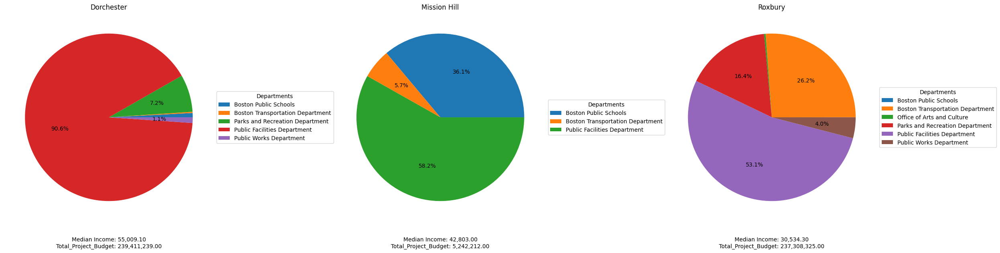

top 3 median income neighborhoods


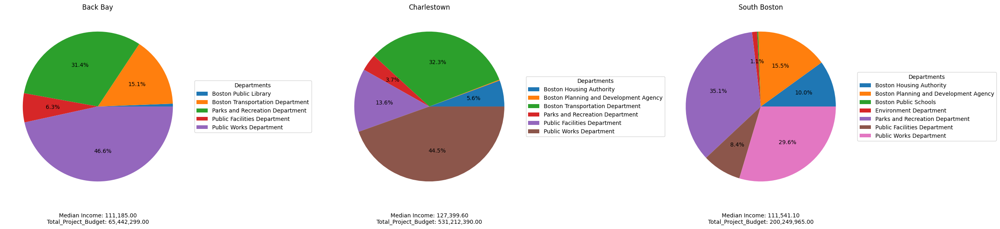

top 3 whitest neighborhoods


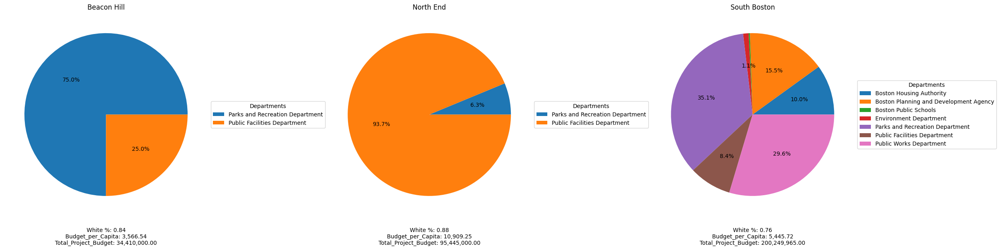

bottom 3 whitest neighborhoods


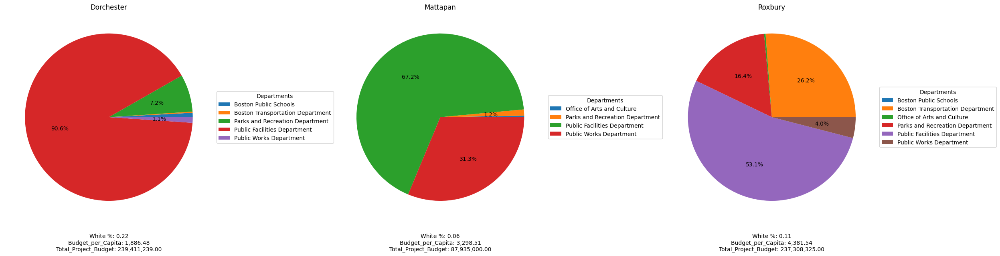

top 3 highest poverty rate


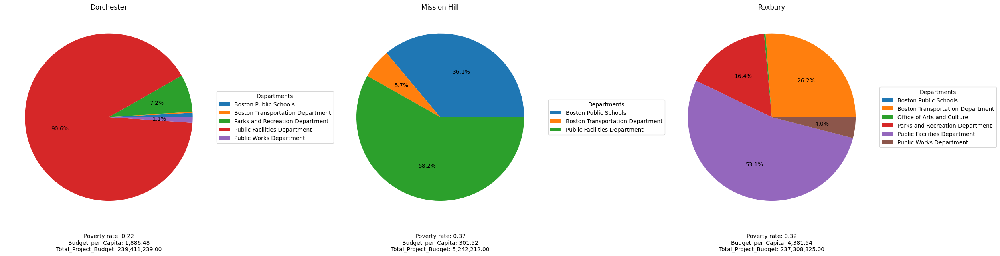

bottom 3 lowest poverty rate


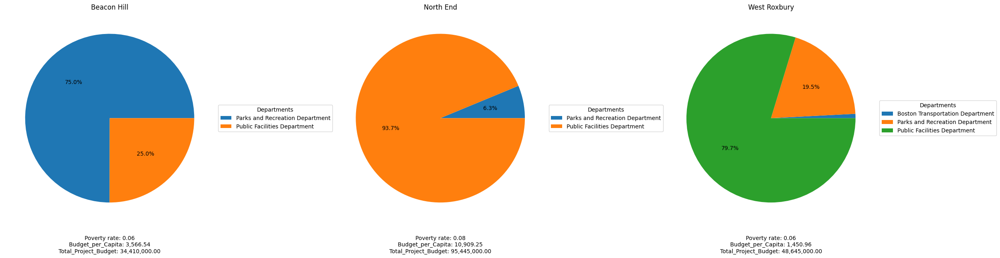

In [7]:
import numpy as np
import matplotlib.pyplot as plt

def plot_pie(df, col_names):
    neighborhoods = df['Neighborhood'].unique()
    n_rows = int(np.ceil(len(neighborhoods) / 2))

    fig, axs = plt.subplots(n_rows, 3, figsize=(25, n_rows*8))
    axs = axs.flatten()

    for ax, neighborhood in zip(axs, neighborhoods):
        neighborhood_data = df[df['Neighborhood'] == neighborhood]
        percentage = neighborhood_data['Total_Dept_Budget'] / neighborhood_data['Total_Dept_Budget'].sum() * 100

        def custom_autopct(pct):
            return ('%1.1f%%' % pct) if pct > 0.9 else None

        wedges, texts, autotexts = ax.pie(percentage, autopct=custom_autopct)
        ax.set_title(neighborhood)
        ax.legend(wedges, neighborhood_data['PM_Department'], title="Departments", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

        # Add information from additional columns
        additional_info = '\n'.join([f'{col}: {neighborhood_data[col].values[0]:,.2f}' for col in col_names])
        ax.text(0.5, -0.1, additional_info, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize=10)

    for i in range(len(neighborhoods), len(axs)):
        fig.delaxes(axs[i])

    plt.tight_layout()
    plt.show()

# income
print("bottom 3 median income neighborhoods")
plot_pie(income_bottom, ['Median Income', 'Total_Project_Budget'])
print("top 3 median income neighborhoods")
plot_pie(income_top, ['Median Income', 'Total_Project_Budget'])

# race
print("top 3 whitest neighborhoods")
plot_pie(white_top, ['White %', 'Budget_per_Capita', 'Total_Project_Budget'])
print("bottom 3 whitest neighborhoods")
plot_pie(white_bottom, ['White %', 'Budget_per_Capita', 'Total_Project_Budget'])

# poverty
print("top 3 highest poverty rate")
plot_pie(poverty_top, ['Poverty rate', 'Budget_per_Capita', 'Total_Project_Budget'])
print("bottom 3 lowest poverty rate")
plot_pie(poverty_bottom, ['Poverty rate', 'Budget_per_Capita', 'Total_Project_Budget'])




## Drop public works dept since it dominates most of the pie charts

In [8]:
income_bottom = income_bottom[income_bottom['PM_Department'] != 'Public Works Department']
income_top = income_top[income_top['PM_Department'] != 'Public Works Department']

white_top = white_top[white_top['PM_Department'] != 'Public Works Department']
white_bottom = white_bottom[white_bottom['PM_Department'] != 'Public Works Department']

poverty_top = poverty_top[poverty_top['PM_Department'] != 'Public Works Department']
poverty_bottom = poverty_bottom[poverty_bottom['PM_Department'] != 'Public Works Department']

bottom 3 median income neighborhoods


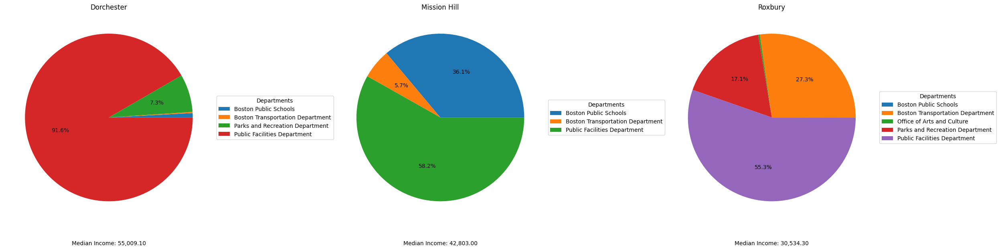

top 3 median income neighborhoods


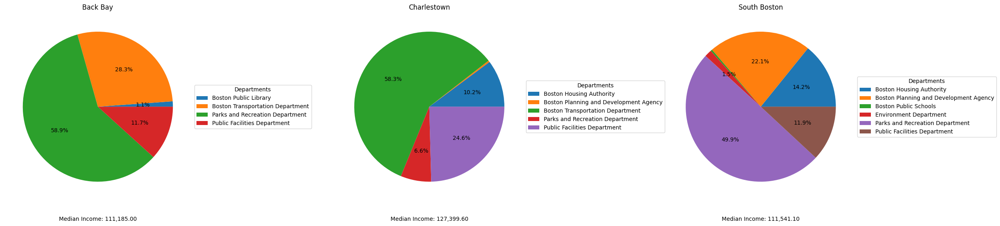

top 3 whitest neighborhoods


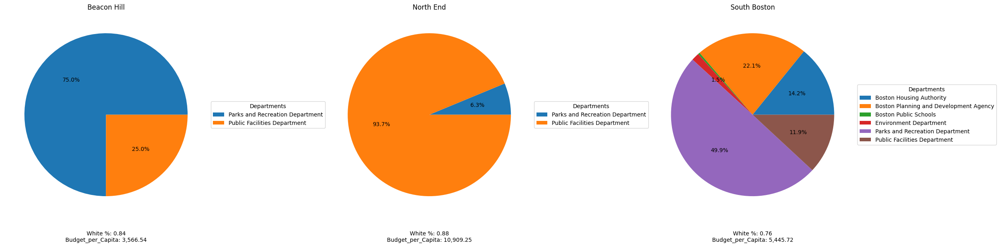

bottom 3 whitest neighborhoods


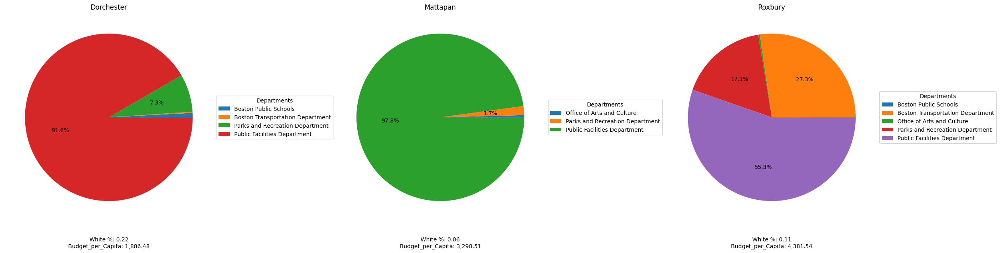

top 3 highest poverty rate


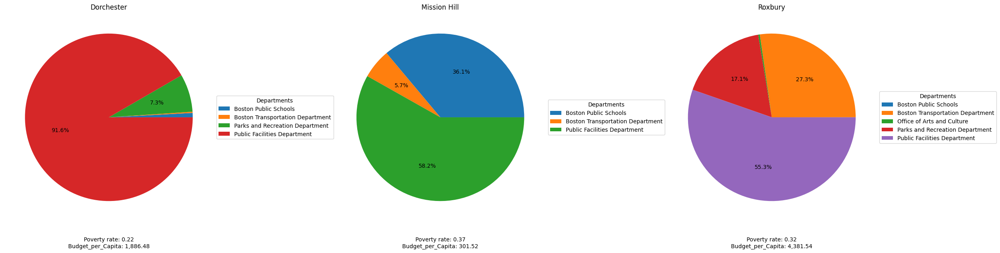

bottom 3 lowest poverty rate


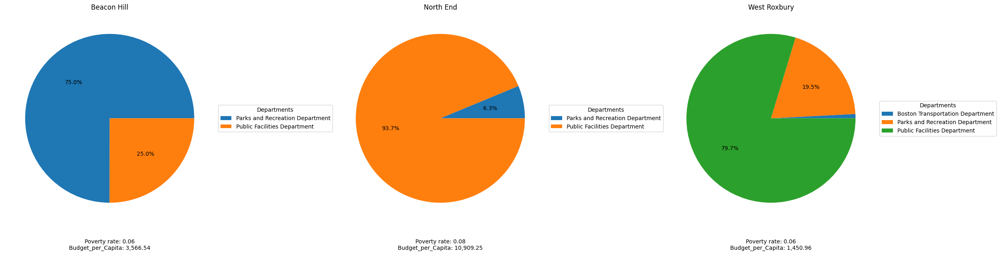

In [9]:
# income
print("bottom 3 median income neighborhoods")
plot_pie(income_bottom, ['Median Income'])
print("top 3 median income neighborhoods")
plot_pie(income_top, ['Median Income'])

# race
print("top 3 whitest neighborhoods")
plot_pie(white_top, ['White %', 'Budget_per_Capita'])
print("bottom 3 whitest neighborhoods")
plot_pie(white_bottom, ['White %', 'Budget_per_Capita'])

# poverty
print("top 3 highest poverty rate")
plot_pie(poverty_top, ['Poverty rate', 'Budget_per_Capita'])
print("bottom 3 lowest poverty rate")
plot_pie(poverty_bottom, ['Poverty rate', 'Budget_per_Capita'])

## what is in public facilities

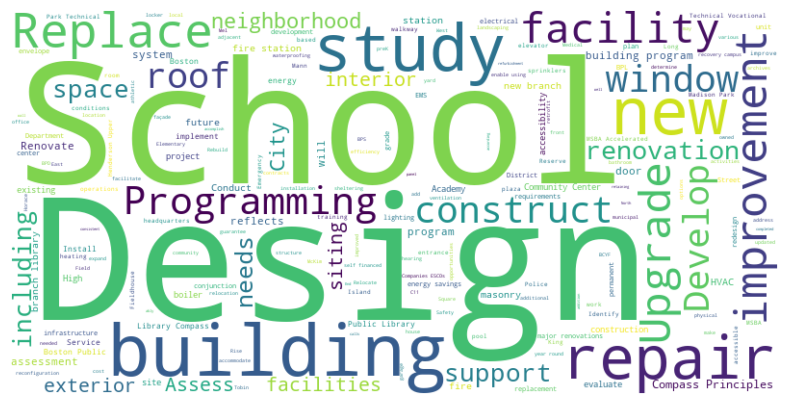

In [11]:
from wordcloud import WordCloud

def gen_word_cloud(df, title='', ColumnName='Scope_Of_Work'):
  # Concatenate all the text in the column into a single string
  text = ' '.join(df[ColumnName])

  # Create a word cloud object
  wordcloud = WordCloud(width=800, height=400, background_color ='white')

  # Generate the word cloud from the text
  wordcloud.generate(text)

  # Display the generated word cloud
  plt.figure(figsize=(10, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')  # Turn off the axis
  plt.title(title)
  plt.show()

capital_df = pd.read_csv("../data/fy24-capital-budget-plan-recommended.csv")

capital_df = capital_df[['Neighborhood', 'PM_Department', 'Scope_Of_Work']]


facilities_df = capital_df[capital_df['PM_Department'] == 'Public Facilities Department']

gen_word_cloud(facilities_df)

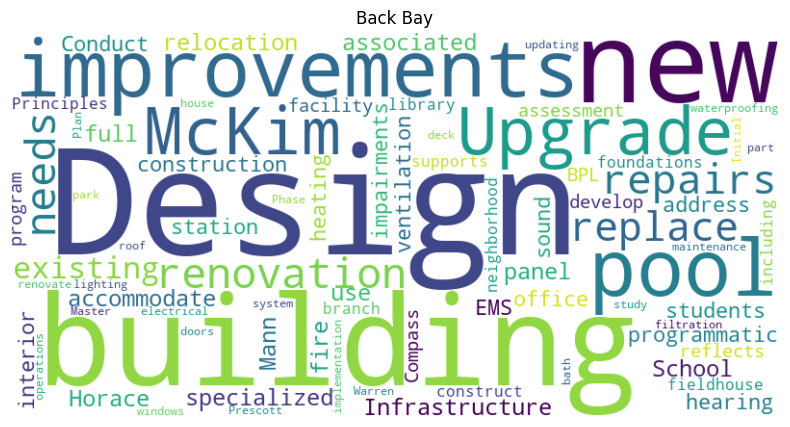

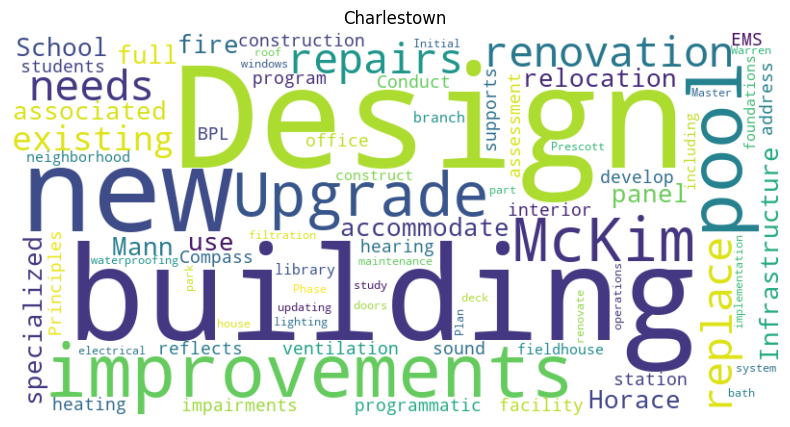

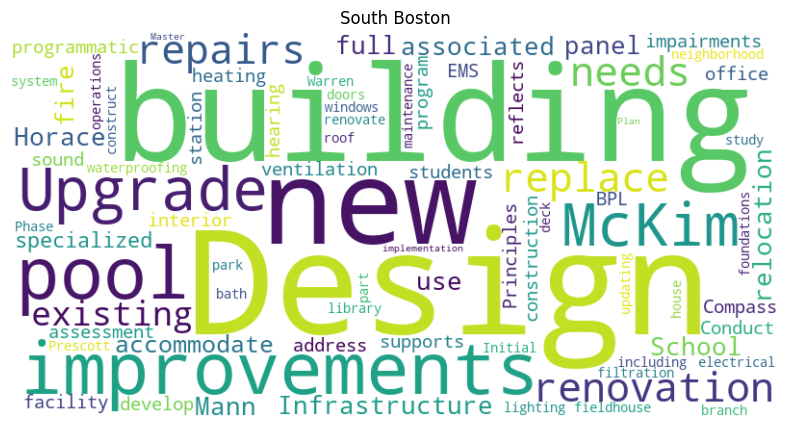

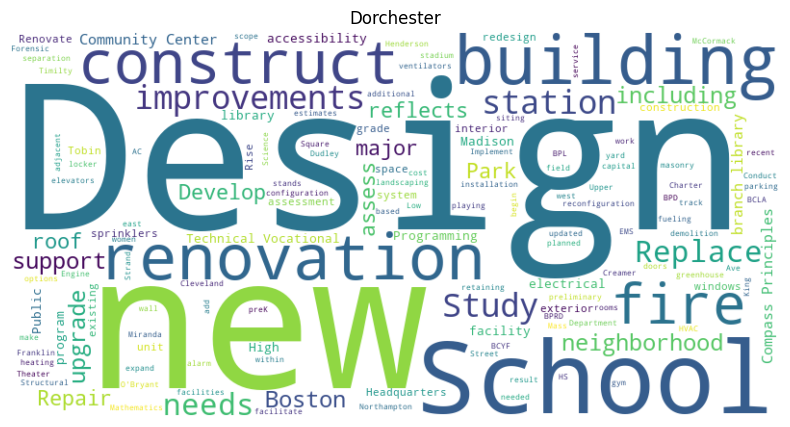

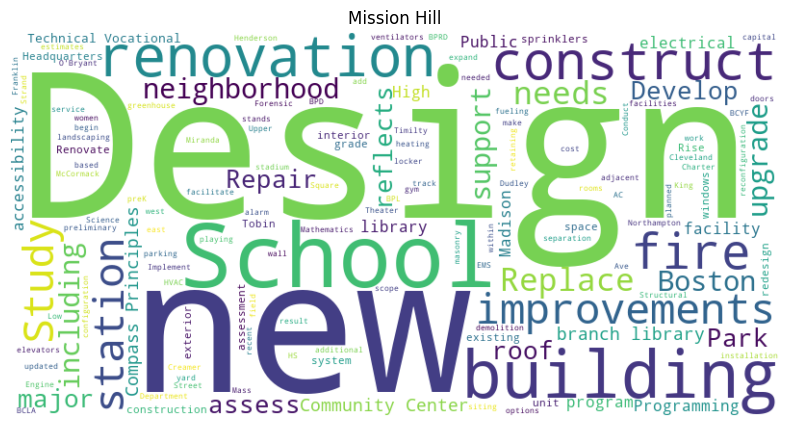

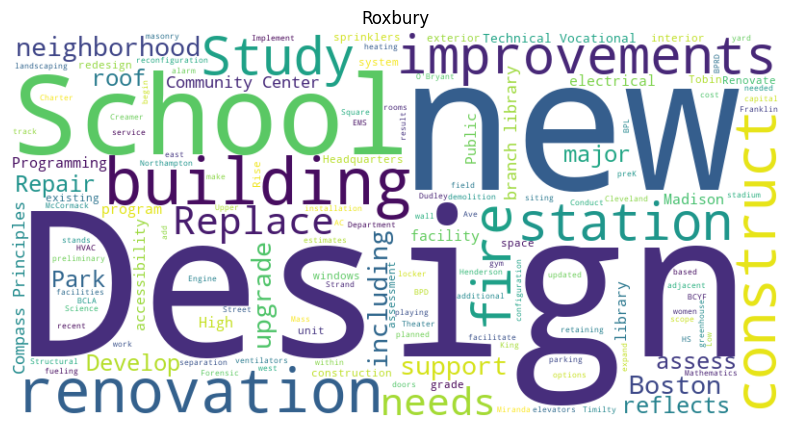

In [12]:
# median income
# Back Bay, Charlestown, South Boston
# Dorchester, Mission Hill, Roxbury

# white
# Beacon Hill, North End, South Boston
# Dorchester, Mattapan, Roxbury

# poverty
# Dorchester, Mission Hill, Roxbury
# Beacon Hill, North End, West Roxbury

def neighborhood_dept_words(neighborhoods, department):
  temp = capital_df[capital_df['PM_Department'] == department]
  for hood in neighborhoods:
    temp2 = temp[temp['Neighborhood'].isin(neighborhoods)]
    gen_word_cloud(temp2, hood)
    print()

# median income top 3
neighborhood_dept_words(['Back Bay', 'Charlestown', 'South Boston'], 'Public Facilities Department')
# median income bottom 3
neighborhood_dept_words(['Dorchester', 'Mission Hill', 'Roxbury'], 'Public Facilities Department')

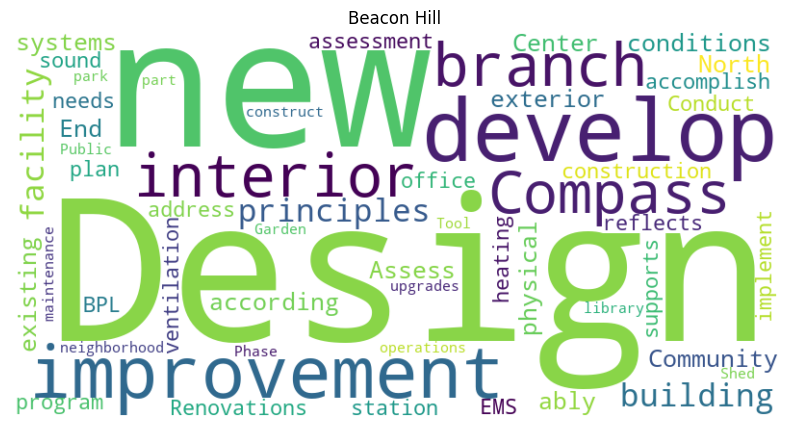

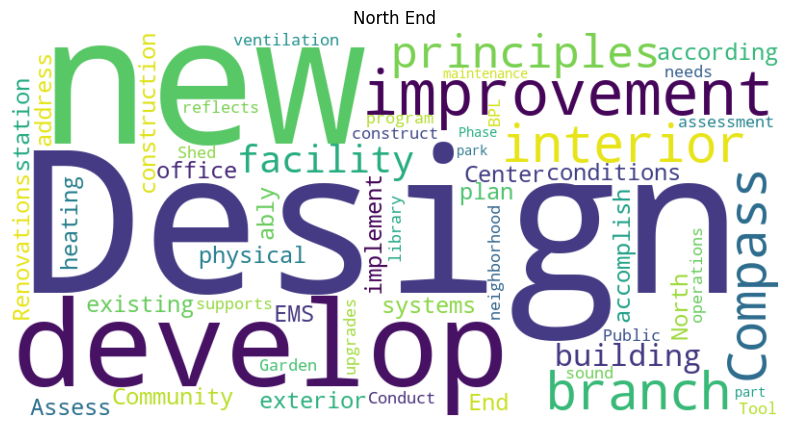

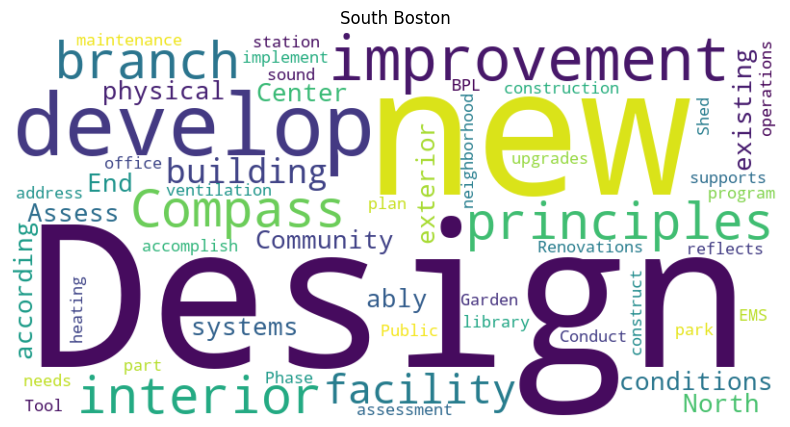

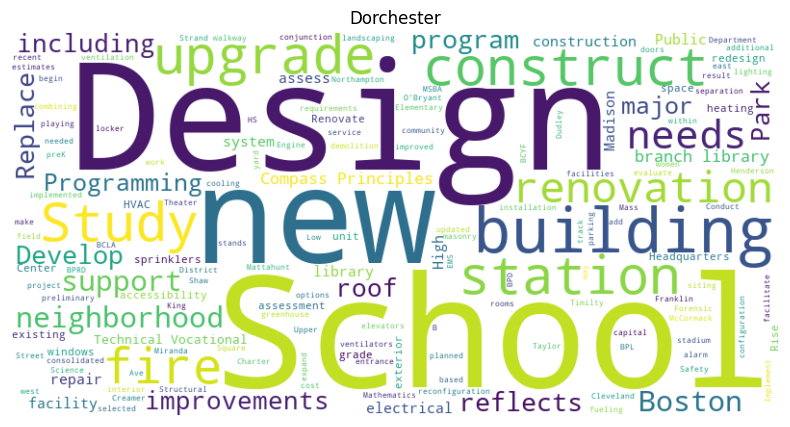

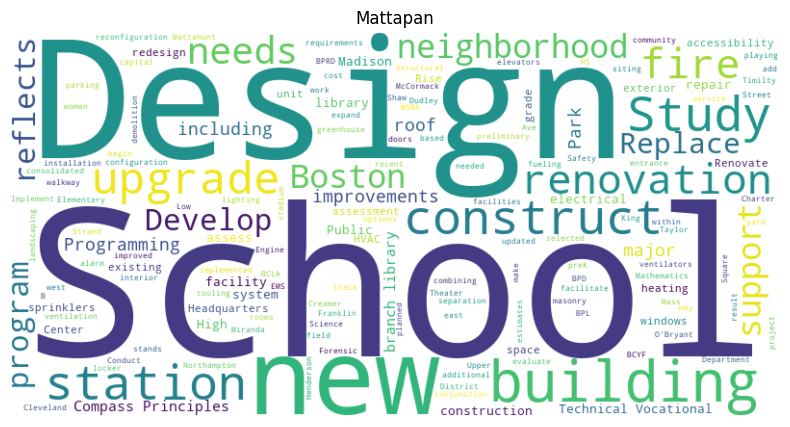

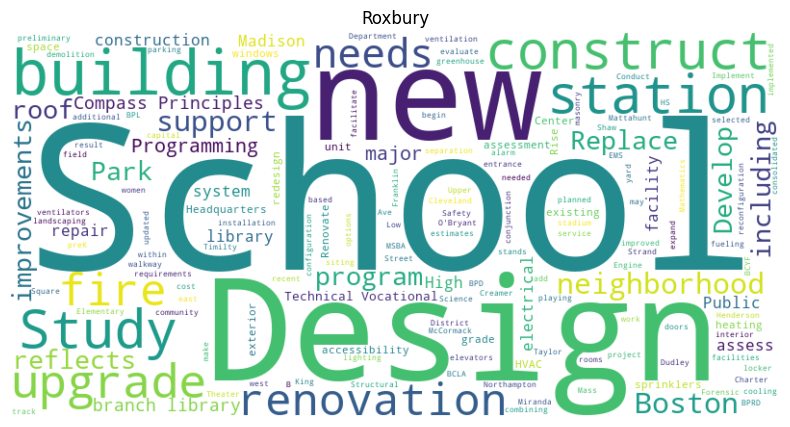

In [13]:
# top 3 white
neighborhood_dept_words(['Beacon Hill', 'North End', 'South Boston'], 'Public Facilities Department')
# bottom 3 white
neighborhood_dept_words(['Dorchester', 'Mattapan', 'Roxbury'], 'Public Facilities Department')

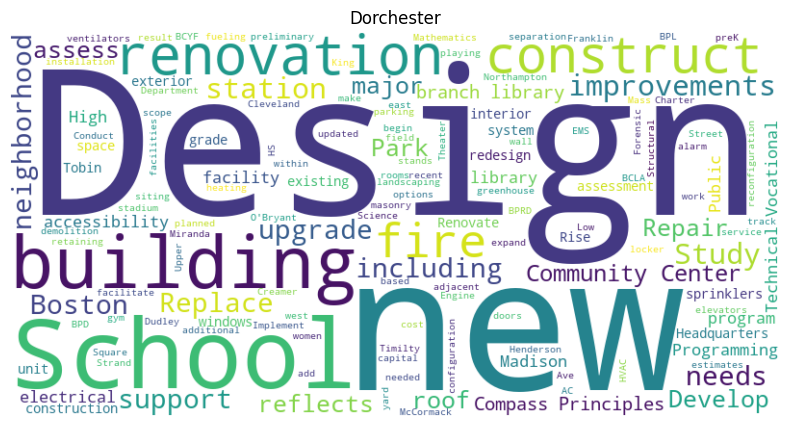

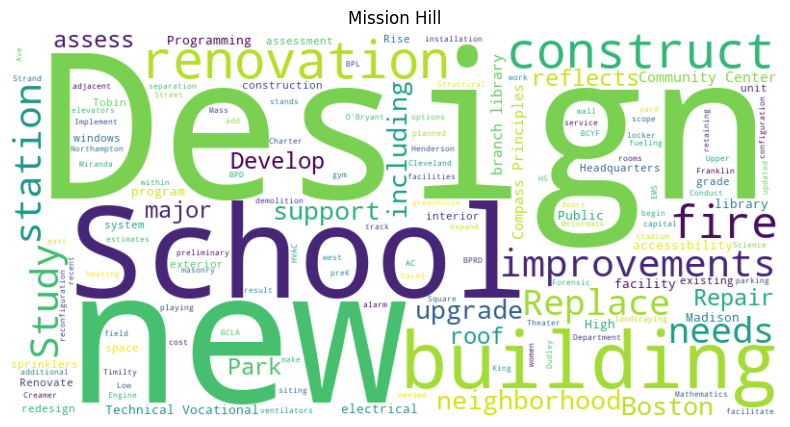

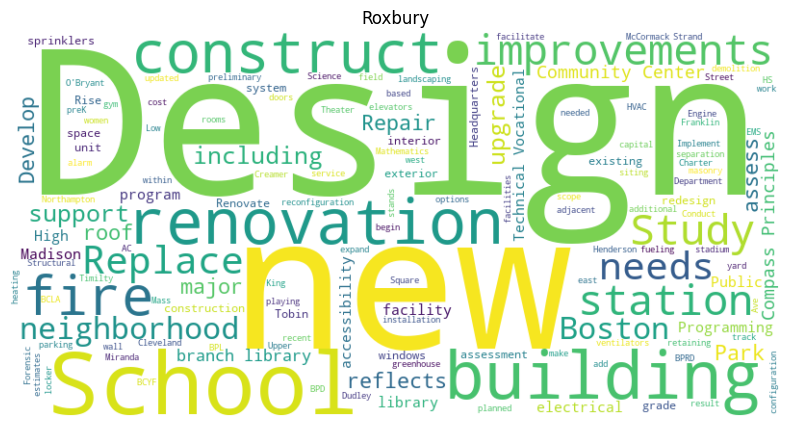

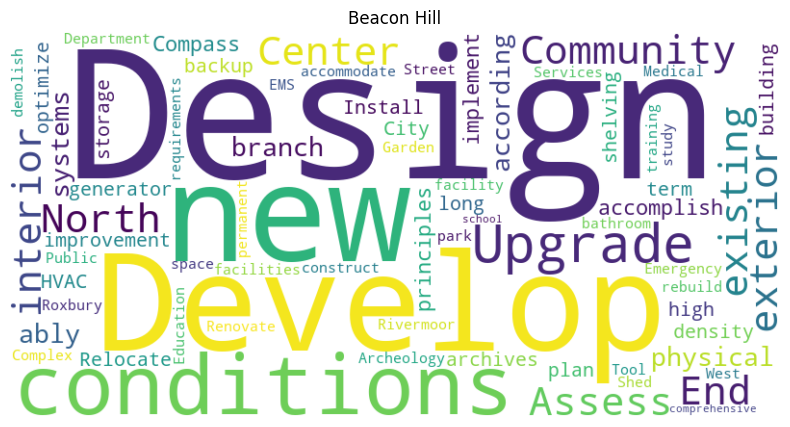

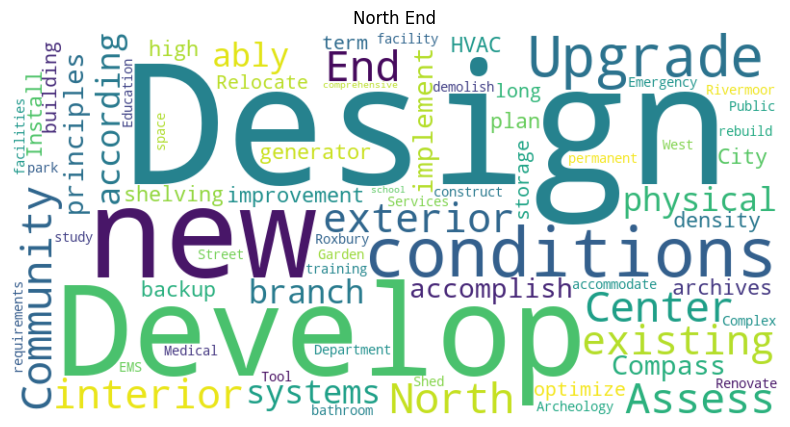

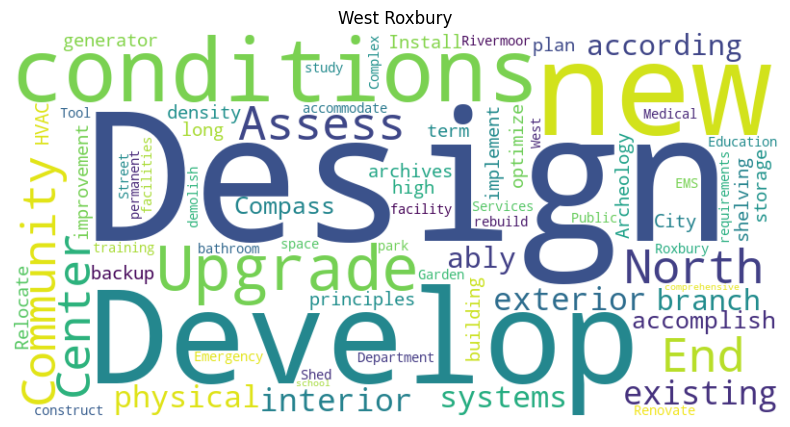

In [14]:
# poverty
# Dorchester, Mission Hill, Roxbury
# Beacon Hill, North End, West Roxbury

# top 3 poverty
neighborhood_dept_words(['Dorchester', 'Mission Hill', 'Roxbury'], 'Public Facilities Department')

# bottom 3 poverty
neighborhood_dept_words(['Beacon Hill', 'North End', 'West Roxbury'], 'Public Facilities Department')


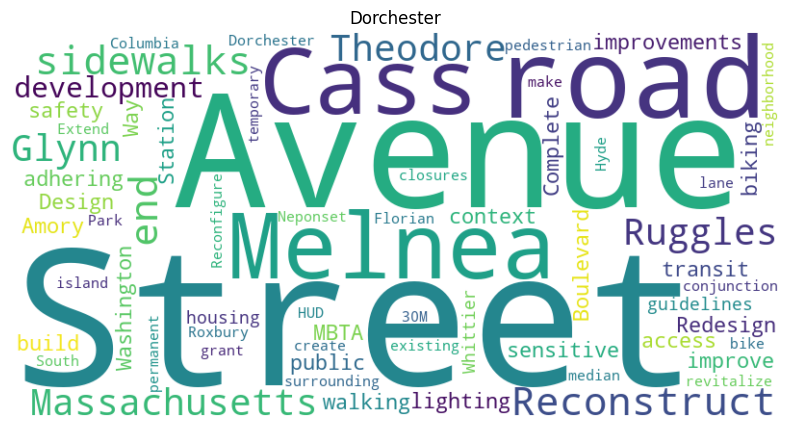

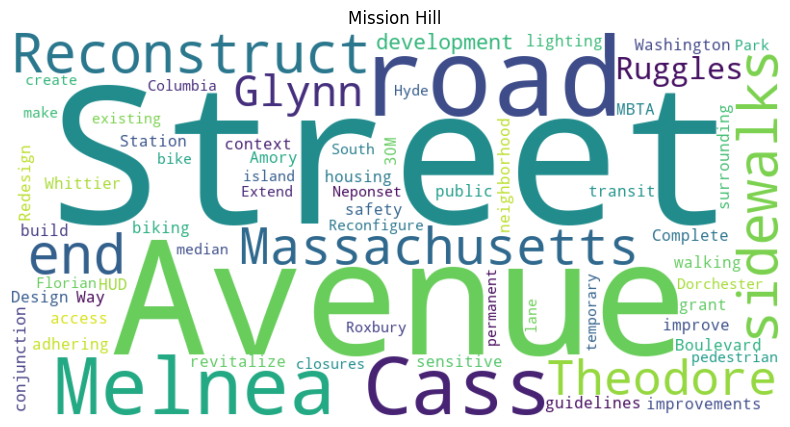

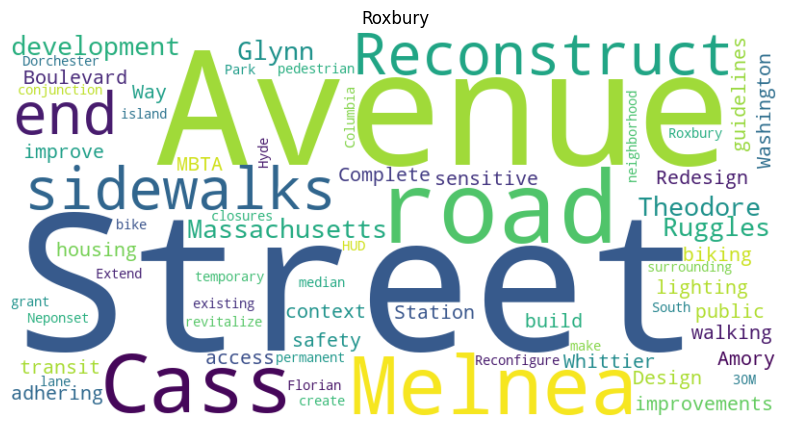

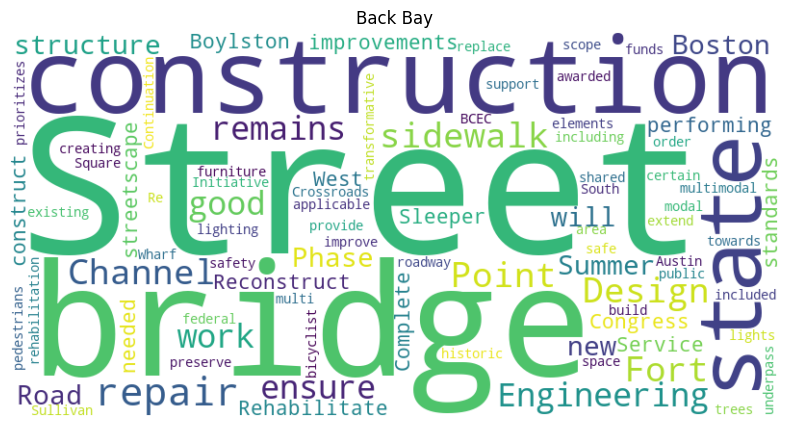

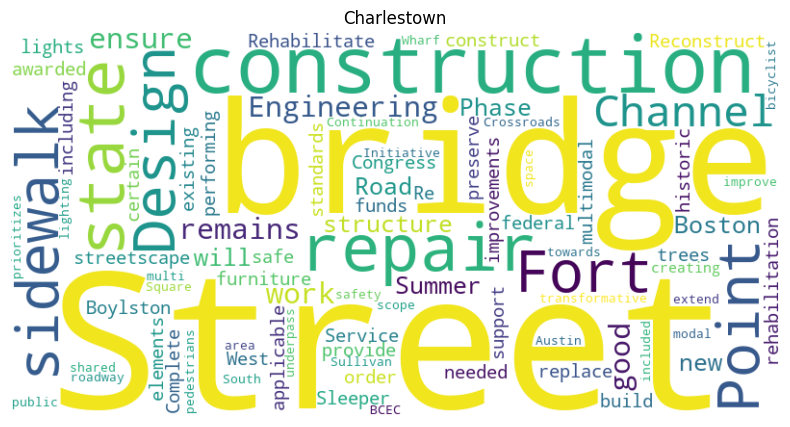

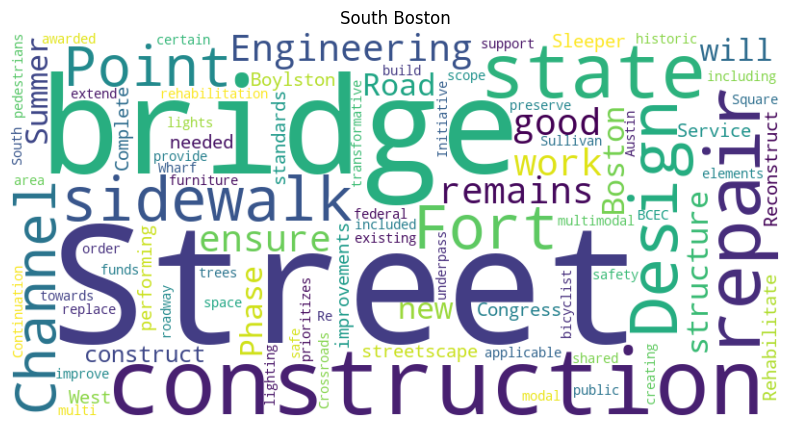

In [15]:
# 'Back Bay', 'Charlestown', 'South Boston',
# 'Beacon Hill', 'North End', 'West Roxbury', 'North End'

# 'Dorchester', 'Mission Hill', 'Roxbury', 'Mattapan'

neighborhood_dept_words(['Dorchester', 'Mission Hill', 'Roxbury'], 'Public Works Department')
neighborhood_dept_words(['Back Bay', 'Charlestown', 'South Boston'], 'Public Works Department')

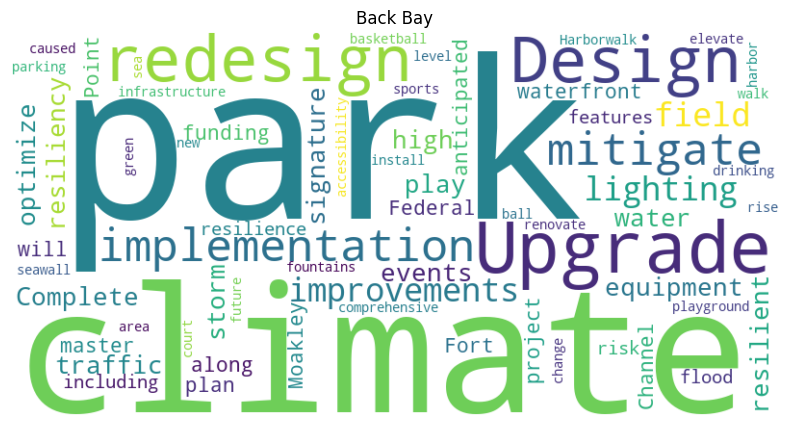

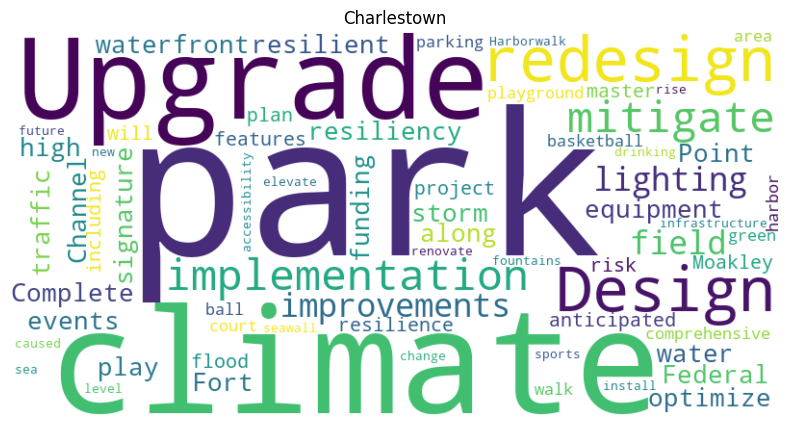

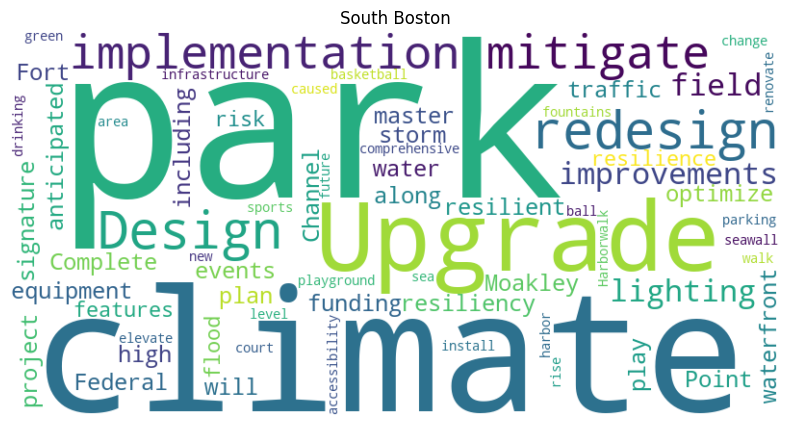

In [16]:
# this is a big one category for the rich neighborhoods
neighborhood_dept_words(['Back Bay', 'Charlestown', 'South Boston'], 'Parks and Recreation Department')